# Markov Random Field & Image Denoising


## Part 1
In this part, we have an image

In [1]:
from PIL import Image
import numpy as np
import pandas as pd
import os, os.path
from scipy import misc
import glob
import sys
from matplotlib.pyplot import imshow
import imageio
import scipy.stats
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy import optimize
import random
np.seterr(all='raise');
import warnings
warnings.filterwarnings('ignore')

### Original Image


initial image


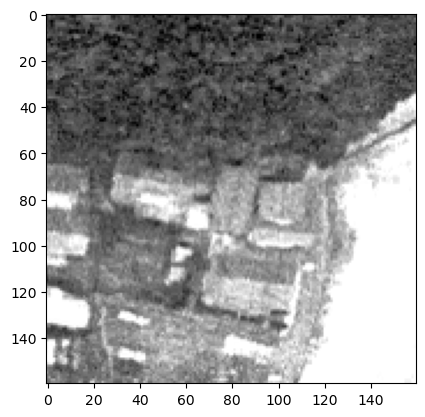

In [2]:
path = 'Desktop/thesis/urban2.bmp'
arr = imageio.imread(path, pilmode='L')  # Use pilmode='F' for floating-point valued result
labels = np.array(arr / 127, dtype=int)
print("initial image")
imshow(arr, cmap='gray');

In [3]:
tmp = plt.gcf().clear()

<Figure size 640x480 with 0 Axes>

## 1. Addition of gaussian noise
In this part we added noise (with normal distribution) to the image.

In [4]:
def add_noise (arr, var):
    noise = np.random.normal(0, np.sqrt(var), arr.shape)
    noisy_arr = arr + noise
    return noisy_arr

### Learn Noise Distribution 


In [5]:
def naive_bayes_learning(arr, noisy_arr, labels):
    class_info = []
    number_of_pixels = arr.size
    for cls in [0,1,2]:
        tmp = []
        for i in range(0, len(arr)):
            for j in range(0, len(arr[0])):
                if (labels[i][j]==cls):
                    tmp.append(noisy_arr[i][j])
        tmp = np.asarray(tmp)
        class_mean = np.mean(tmp)
        class_var = np.var(tmp)
        class_freq = len(tmp)
        class_probabilty = class_freq/number_of_pixels
        class_info.append([class_probabilty, class_mean, class_var])
    return class_info

    Normal PDF

In [6]:
def pdf_of_normal(x, mean, var):
    return (1/np.sqrt(2 *  np.pi * var))*np.exp(-((x-mean)**2)/(2*var))

### Naive Bayes Classifier
We used naive bayes classifier for predicting the real label of each pixel

In [7]:
def naive_bayes_predict (arr, class_info, fixed_pixels_index=[], correct_arr = []):
    predict_array = np.zeros((len(arr), len(arr[0])), dtype=float)
    class_color = [0,127,255]
    for i in range(0, len(arr)):
        for j in range(0, len(arr[0])): 
            if (len(fixed_pixels_index)>0 and len(correct_arr)>0 and fixed_pixels_index[i][j]==1):
                predict_array[i][j]=correct_arr[i][j]
                continue
            max_probabilty = 0
            best_class = -1
            val = arr[i][j]
            for cls_index in range(len(class_info)):
                cls_p =  class_info[cls_index][0]
                mean =  class_info[cls_index][1]
                var = class_info[cls_index][2]
                pos =pdf_of_normal(val, mean, var)
                cls_posterior = cls_p * pos

                if (cls_posterior > max_probabilty):
                    max_probabilty = cls_posterior
                    best_class = cls_index
            
            predict_array[i][j] = class_color[best_class]
            
    return predict_array

## 2. Naive Bayes classsifier
In this part, we used Naive Bayes classifier defined in part A to classify true labels for each of the image's pixels.

Noisy Image with var 100


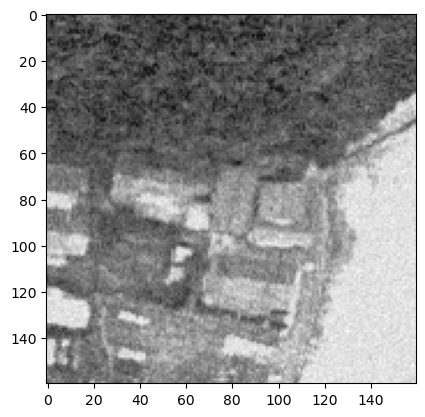

Naive Bayes Classifier Labels


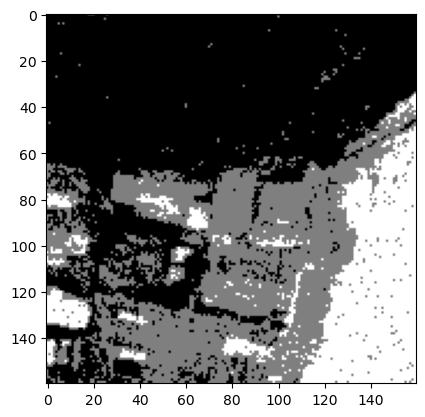

Noisy Image with var 1000


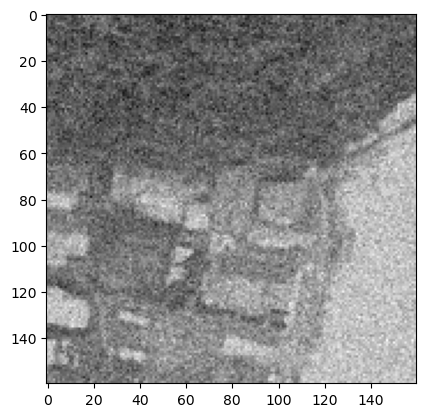

Naive Bayes Classifier Labels


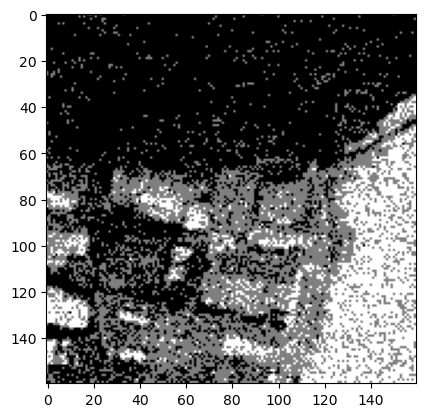

Noisy Image with var 20000


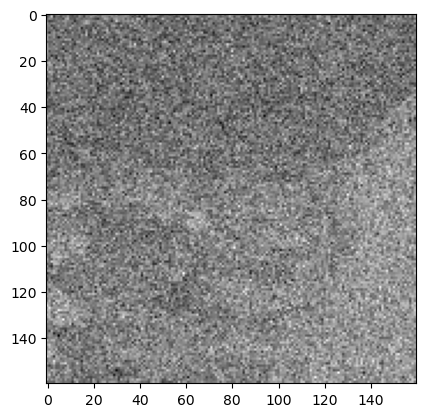

Naive Bayes Classifier Labels


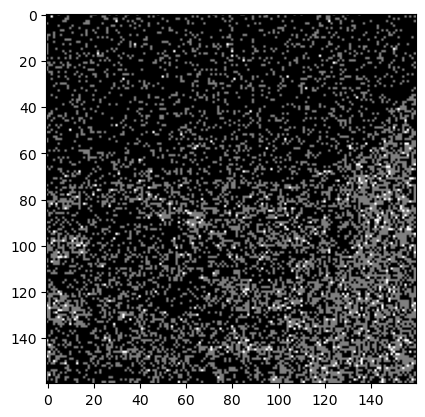

In [8]:
variance_list = [100, 1000, 20000]
for var in variance_list:
    noisy_arr = add_noise(arr, var)
    cls_info = naive_bayes_learning(arr, noisy_arr, labels)
    prediciton_array = naive_bayes_predict(noisy_arr, cls_info)
    print ("Noisy Image with var", var)
    plt.imshow(noisy_arr, cmap='gray')
    plt.show()
    print ("Naive Bayes Classifier Labels")
    plt.imshow(prediciton_array, cmap='gray')
    plt.show()

As you can see the results, this approach worked well when the noise variance is 10, but when the noise increases, this approach didn't work well.

## Energy Function
Markov Random Field Models provide a simple and effective way to model the spatial dependencies in image pixels. <br>
So we useed them to model the connection between two neighbour pixels. <br>
In our problem we have to define an energy function on hidden states corresponding to true values of each pixels, then we minimize this function to obtain the best prediction. <br>
Our energy function is defined as below: <br>
 

$U(w)=\sum_{s} (\lg (\sigma_{\omega_{s}} \sqrt{2 \pi}) + \frac{(f_s - \mu_{\omega_{s}})^2}{2(\sigma_{\omega_{s}})^2}) + \sum_{s,r} \beta \delta (s,r)  $

In [9]:
def distance (x,y):
    a = x-y
    a = a*a
    return np.sqrt(np.sum(a))

In [10]:
def differnce(a,b):
    if (a==b):
        return -1
    else:
        return 1

In [11]:
def initial_energy_function(initial_w, pixels, betha, cls_info, neighbors_indices):
    w = initial_w
    energy = 0.0
    rows = len(w)
    cols = len(w[0])
    for i in range(0, len(w)):
        for j in range(0, len(w[0])):
            mean = cls_info[int (w[i][j])][1]
            var =  cls_info[int (w[i][j])][2]
            energy += np.log(np.sqrt(2*np.pi*var)) 
            energy += ((pixels[i][j]-mean)**2)/(2*var)
            for a,b in neighbors_indices:
                a +=i
                b +=j
                if 0<=a<rows and 0<=b<cols:
                    energy += betha * differnce(w[i][j], w[a][b])
    return energy

In [12]:
def exponential_schedule(step_number, current_t, initial_temp,  constant=0.99):
    return current_t*constant
def logarithmical_multiplicative_cooling_schedule(step_number, current_t, initial_temp, constant=1.0):
    return initial_temp / (1 + constant * np.log(1+step_number))
def linear_multiplicative_cooling_schedule(step_number, current_t, initial_temp, constant=1.0):
    return initial_temp / (1 + constant * step_number)

In [13]:
def delta_enegry(w, index, betha, new_value, neighbors_indices, pixels, cls_info):
    initial_energy = 0 
    (i,j) = index
    rows = len(w)
    cols = len(w[0])
    mean = cls_info[int(w[i][j])][1]
    var =  cls_info[int(w[i][j])][2]
    initial_energy += np.log(np.sqrt(2*np.pi*var)) 
    initial_energy += ((pixels[i][j]-mean)**2)/(2*var)
    for a,b in neighbors_indices:
        a +=i
        b +=j
        if 0<=a<rows and 0<=b<cols:
            initial_energy += betha * differnce(w[i][j], w[a][b])
    
    new_energy = 0
    mean = cls_info[new_value][1]
    var =  cls_info[new_value][2]
    new_energy += np.log(np.sqrt(2*np.pi*var)) 
    new_energy += ((pixels[i][j]-mean)**2)/(2*var)
    # print("/////// \n first enegry", new_energy)

    for a,b in neighbors_indices:
        a +=i
        b +=j
        if 0<=a<rows and 0<=b<cols:
            new_energy += betha * differnce(new_value, w[a][b])

    # print ("END energy", new_energy)

    return new_energy - initial_energy

In [14]:
def simulated_annealing(init_w, class_labels, temprature_function,
                        pixels, betha, cls_info, neighbors_indices, max_iteration=10000,
                        initial_temp = 1000, known_index=[], correct_arr = [], temprature_function_constant=None ):
    partial_prediction=False
    if (len(known_index)>0 and len(correct_arr)>0):
        partial_prediction=True

    w = np.array(init_w)
    changed_array = np.zeros((len(w), len(w[0])))
    iteration =0
    x = len(w)
    y = len(w[0])
    current_energy = initial_energy_function(w, pixels, betha, cls_info, neighbors_indices)
    current_tmp = initial_temp
    while (iteration<max_iteration):
        if (partial_prediction):
            is_found=False
            while (is_found==False):
                i = random.randint(0, x-1)
                j = random.randint(0, y-1)
                if (known_index[i][j]==0):
                    is_found=True
        else:
            i = random.randint(0, x-1)
            j = random.randint(0, y-1)

        l = list(class_labels)
        l.remove(w[i][j])
        r = random.randint(0, len(l)-1)
        new_value = l[r]
        delta = delta_enegry(w, (i,j), betha, new_value, neighbors_indices, pixels, cls_info)

        r = random.uniform(0, 1)

        if (delta<=0):
            w[i][j]=new_value
            current_energy+=delta
            changed_array[i][j]+=1
            # print ("CHANGED better")
        else:
            try:
                if (-delta / current_tmp < -600):
                    k=0
                else:
                    k = np.exp(-delta / current_tmp)
            except:
                k=0

            if r < k:
                # print("CHANGED worse")
                w[i][j] = new_value
                current_energy += delta
                changed_array[i][j] += 1
        if (temprature_function_constant!=None):
            current_tmp = temprature_function(iteration, current_tmp, initial_temp, constant =temprature_function_constant)
        else:
            current_tmp = temprature_function(iteration, current_tmp, initial_temp)
        iteration+=1
    return w, changed_array

In [15]:
def convert_to_class_labels(arr, inverse_array={0: 0, 127: 1, 255: 2}):
    for i in range(0, len(arr)):
        for j in range(0, len(arr[0])):
            pixel_value = int(arr[i][j])
            # Find the closest key in inverse_array to pixel_value
            closest_key = min(inverse_array.keys(), key=lambda k: abs(k-pixel_value))
            arr[i][j] = inverse_array[closest_key]


In [16]:
def get_accuracy(arr, labels):
    correct = 0
    for i in range(0, len(arr)):
        for j in range(0, len(arr[0])):
            if (labels[i][j]==int(arr[i][j]/127)):
                correct+=1
    return correct/(len(arr[0])*len(arr))

In [17]:
# plt.close('all')
def a_complete_set_for_part_1 (arr, max_iter=1000000,var = 10000,
                               betha = 100,
                               neighbor_indices = [[0,1],[0,-1],[1,0],[-1,0]],
                               class_labels = [0,1,2], 
                               class_color = [0,127,255], 
                               schedule= exponential_schedule,
                               temprature_function_constant=None):

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4)
#     fig.suptitle('Comparision', fontsize=20)
    
    noisy_arr = add_noise(arr, var)
    ax1.set_title('Noisy image \n accuracy '+str(get_accuracy(noisy_arr, labels)))

    ax1.imshow(noisy_arr, cmap='gray')


    rows = len(noisy_arr)
    cols = len(noisy_arr[0])

    cls_info = naive_bayes_learning(arr, noisy_arr, labels)

    initial_arr = naive_bayes_predict(noisy_arr, cls_info)
    ax2.set_title('Naive Bayes image \n accuracy '+str(get_accuracy(initial_arr, labels)))
    ax2.imshow(initial_arr, cmap='gray')

    convert_to_class_labels(initial_arr)
    
    w, test_array = simulated_annealing(initial_arr, class_labels, schedule,
                                        noisy_arr, betha, cls_info, neighbor_indices, max_iteration=max_iter)

    
    for i in range (0, len(w)):
        for j in range(0, len(w[0])):
            w[i][j] = class_color[int (w[i][j])]

    ax3.set_title('CRF image \n accuracy '+str(get_accuracy(w, labels)))
    ax3.imshow(w, cmap='gray')
    plt.rcParams["figure.figsize"] = (20,3)


    ax4.set_title('differ image')

    ax4.imshow(test_array, cmap='gray')

    plt.show()

## 4. plots
We used naive bayes results of 2. as the initial state for the true pixels values. Then we used simulated annealing optimization method. We tested different hyper pararmeters to compare the performance of the MRF models with  naive bayes model. <br>

In [18]:
plt.figure(figsize=(10, 12), dpi=80, facecolor='w', edgecolor='k')

<Figure size 800x960 with 0 Axes>

<Figure size 800x960 with 0 Axes>

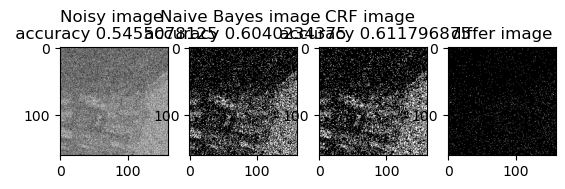

In [19]:
a_complete_set_for_part_1(arr, max_iter=1e4, var=1e4, betha=1e2)

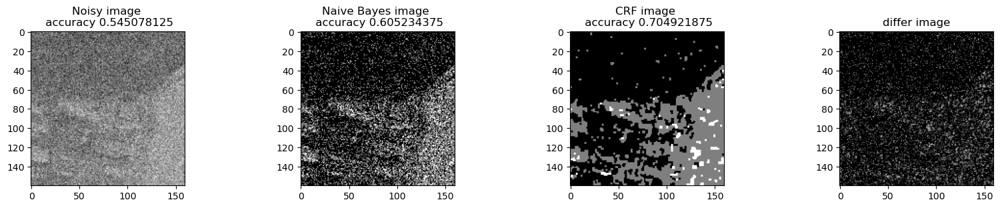

In [20]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=1e2)

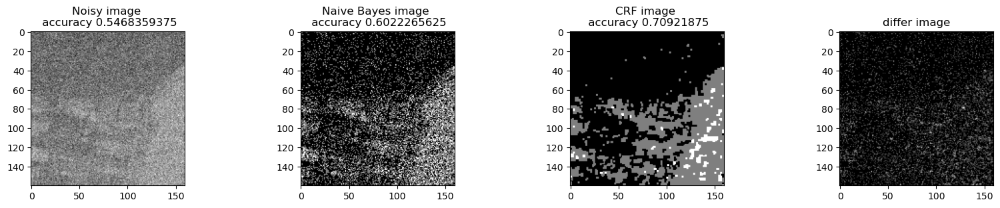

In [21]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=1e4)

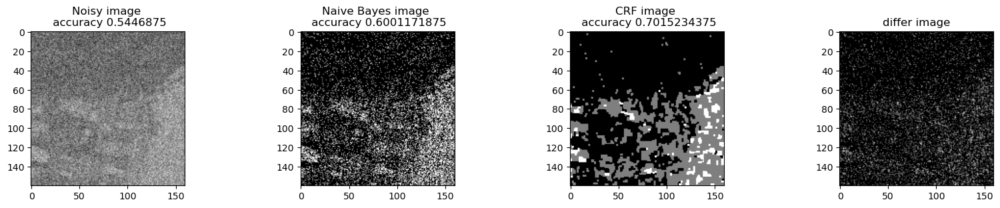

In [22]:
a_complete_set_for_part_1(arr, max_iter=1e7, var=1e4, betha=1e4)

## 5. Comparison of 4 neighbour and 8 neiighbours
We compared two different modes. First mode uses only four neighbors pixels. Second mode uses eight neighbors pixels in the model. The result is as below.

### Model with four neighbors

<Figure size 800x960 with 0 Axes>

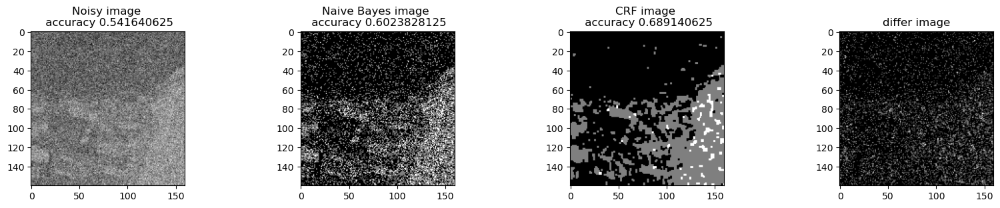

In [23]:
plt.figure(figsize=(10, 12), dpi=80, facecolor='w', edgecolor='k')
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=1e4)

### Model with eight neighbors

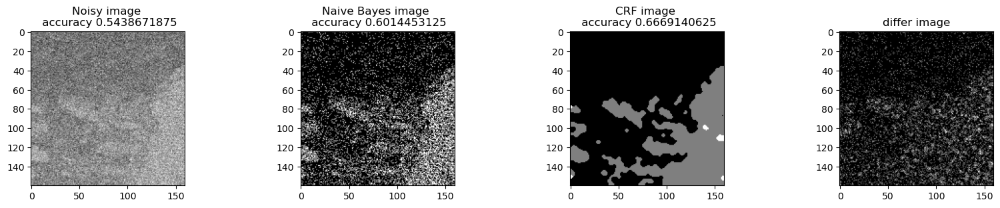

In [26]:
eight_neighbors_indices =  [[0,1],[0,-1],[1,0],[-1,0],[1,1],[1,-1],[-1,1],[-1,-1]]
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=1e4, neighbor_indices=eight_neighbors_indices)

### Comparision
When we used eight neighbours, the smoothness of result increased. The weakness of eight neighbors parameter is that the model can't find a good boundary for the circle in the center. Because circles border are different from rectangles and so the number of same color in the border of circle is less than rectangles border. And the model connot predict well in this situation. If we use lower betha, then the result for the circle is going to be better.

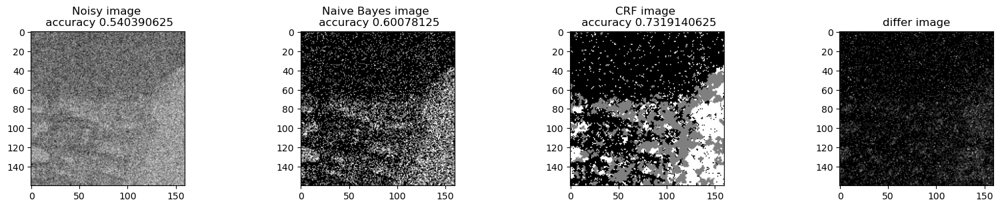

In [27]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=1e-1, neighbor_indices=eight_neighbors_indices)

## 6. different hyperparameters
we test different  $\beta$ values as the hyperparameter

Betha 0.0001


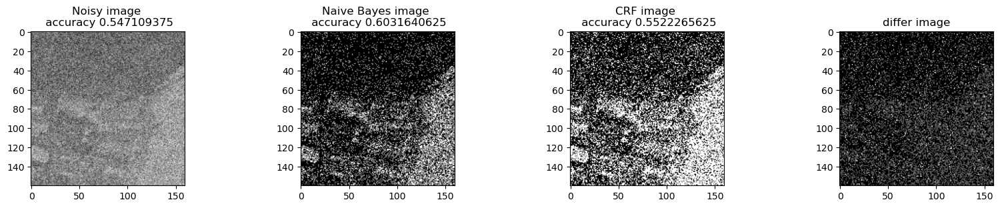

In [28]:
bta = 1e-4
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 0.001


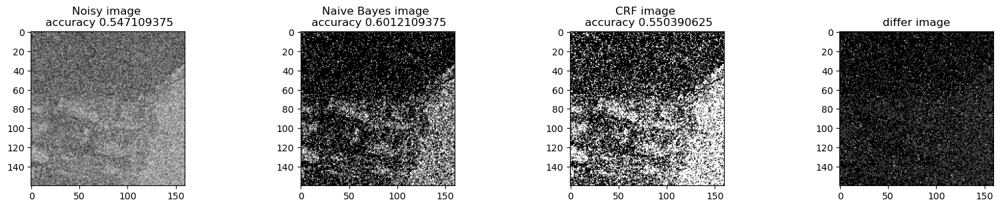

In [29]:
bta = 1e-3
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 0.01


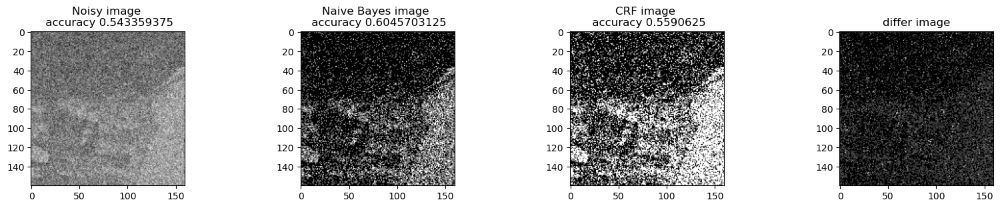

In [30]:
bta = 1e-2
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 0.1


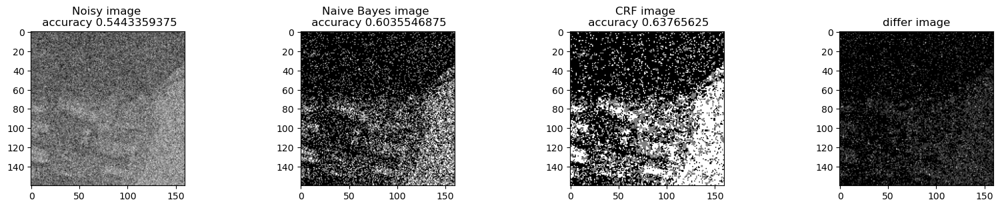

In [31]:
bta = 1e-1
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 1.0


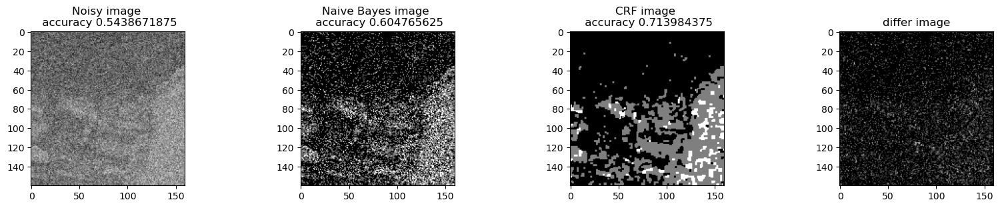

In [32]:
bta = 1e0
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 10.0


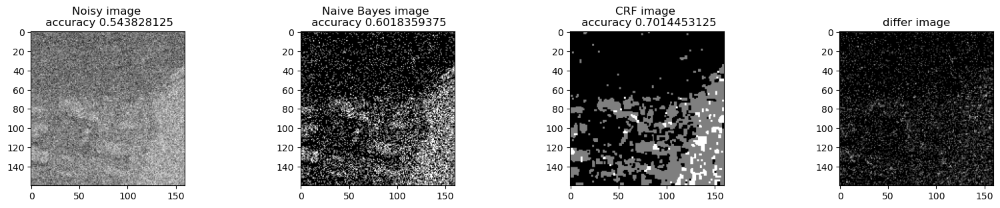

In [33]:
bta = 1e1
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 100.0


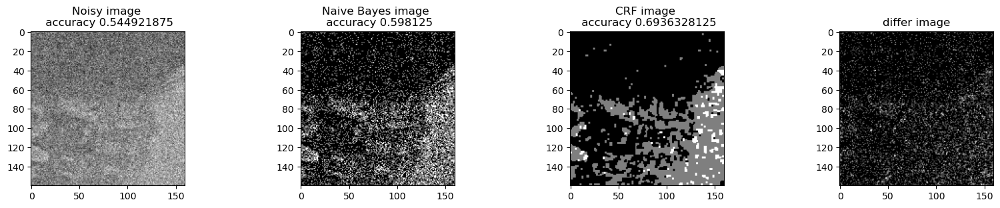

In [34]:
bta = 1e2
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

Betha 10000.0


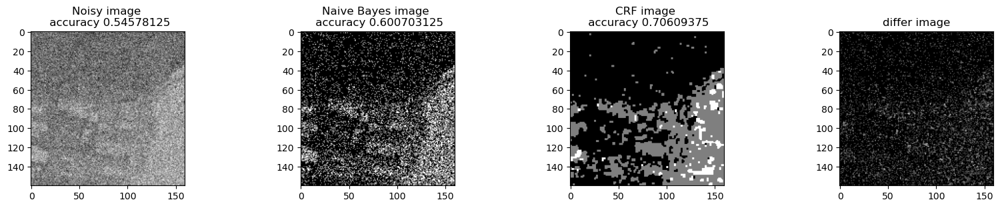

In [35]:
bta = 1e4
print ("Betha", bta)
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta)

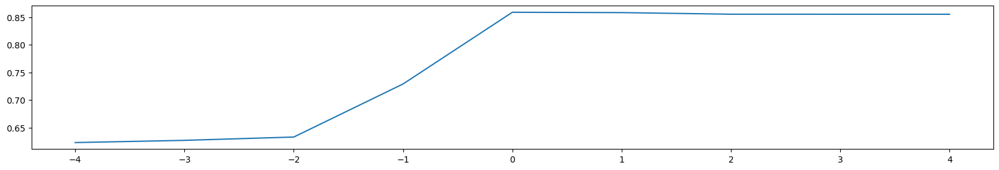

In [36]:
xs = [-4,-3,-2,-1,0,1,2,4]
accs = [0.623, 0.627, .633, .729, .8587, .8581, .8552, .8551]
plt.plot(xs, accs)
plt.show()

According to the above graph, the best $\beta$ is 1e0=1.

## 7. prediction of complete image
In this part, we have some part of the image and we want to predict the remaining part. 

In [37]:
def a_complete_set_for_part_1_some_pixels_known (arr,known_index, max_iter=1000000,var = 10000,
                               betha = 100,
                               neighbor_indices = [[0,1],[0,-1],[1,0],[-1,0]],
                               class_labels = [0,1,2],
                               class_color = [0,127,255],
                               schedule= exponential_schedule
                            ,temprature_function_constant=None):


    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4)
#     fig.suptitle('Comparision', fontsize=20)

    noisy_arr = add_noise(arr, var)
    for i in range(0, len(arr)):
        for j in range(0, len(arr[0])):
            if known_index[i][j] == 1:
                noisy_arr[i][j]=arr[i][j]

    ax1.set_title('Noisy image \n accuracy '+str(get_accuracy(noisy_arr, labels)))

    ax1.imshow(noisy_arr, cmap='gray')


    rows = len(noisy_arr)
    cols = len(noisy_arr[0])

    cls_info = naive_bayes_learning(arr, noisy_arr, labels)

    initial_arr = naive_bayes_predict(noisy_arr, cls_info, fixed_pixels_index=known_index, correct_arr = arr)
    ax2.set_title('Naive Bayes image \n accuracy '+str(get_accuracy(initial_arr, labels)))
    ax2.imshow(initial_arr, cmap='gray')

    convert_to_class_labels(initial_arr)

    w, test_array = simulated_annealing(initial_arr, class_labels, schedule,
                                        noisy_arr, betha, cls_info, neighbor_indices,
                                        max_iteration=max_iter, known_index=known_index, correct_arr=arr)


    for i in range (0, len(w)):
        for j in range(0, len(w[0])):
            w[i][j] = class_color[int (w[i][j])]

    ax3.set_title('CRF image \n accuracy '+str(get_accuracy(w, labels)))
    ax3.imshow(w, cmap='gray')
    plt.rcParams["figure.figsize"] = (20,3)


    ax4.set_title('differ image')

    ax4.imshow(test_array, cmap='gray')

    plt.show()

<Figure size 800x960 with 0 Axes>

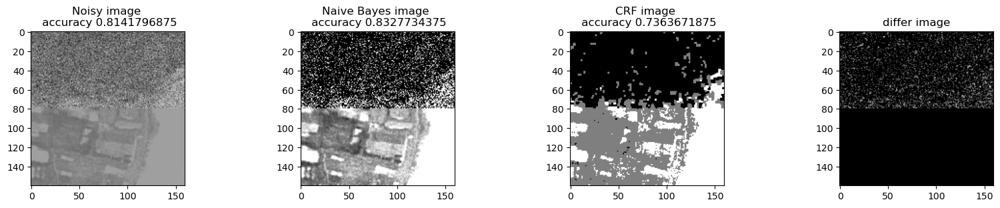

In [41]:
plt.figure(figsize=(10, 12), dpi=80, facecolor='w', edgecolor='k')
known_index = np.zeros((len(arr), len(arr[0])))
half_row = len(arr) // 2
for i in range(0, len(arr)):
    for j in range(0, len(arr[0])):
        if i < half_row:
            known_index[i][j] = 0  # Mark top half as known
        else:
            known_index[i][j] = 1
bta = 1e4
a_complete_set_for_part_1_some_pixels_known(arr,  known_index, max_iter=1e6, var=1e4, betha=bta)

## 8. optimization
In this part, we compared different schedules in simulated annealing optimizer.<br>
We tested different scheduling Strategy. And the result is as follow.

#### Exponential Schedule

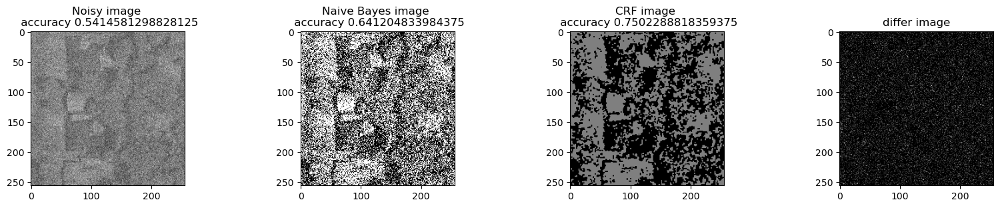

In [84]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta,
                          schedule=exponential_schedule, temprature_function_constant=0.8)

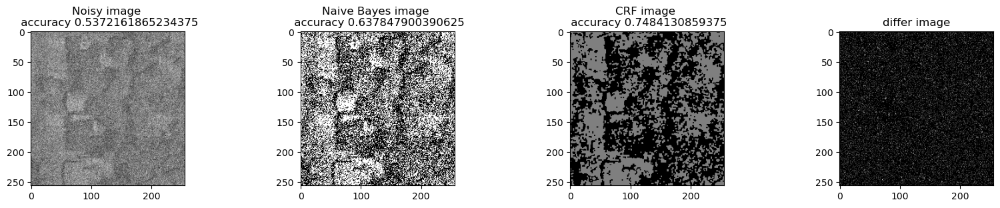

In [85]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta,
                          schedule=exponential_schedule, temprature_function_constant=0.9)

#### Logarithmical Multiplicative Cooling Schedule

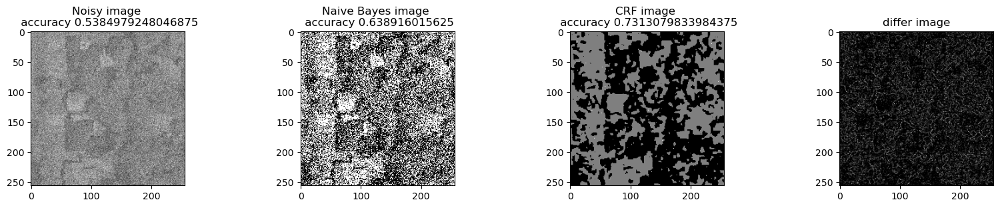

In [86]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta,
                          schedule=logarithmical_multiplicative_cooling_schedule, temprature_function_constant=1.0)

#### Linear Multiplicative Cooling Schedule

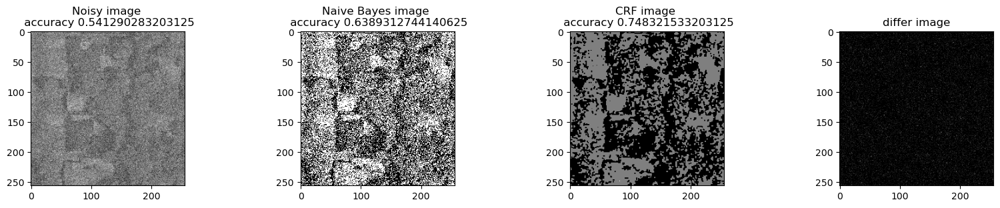

In [87]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta,
                          schedule=linear_multiplicative_cooling_schedule, temprature_function_constant=1.0)

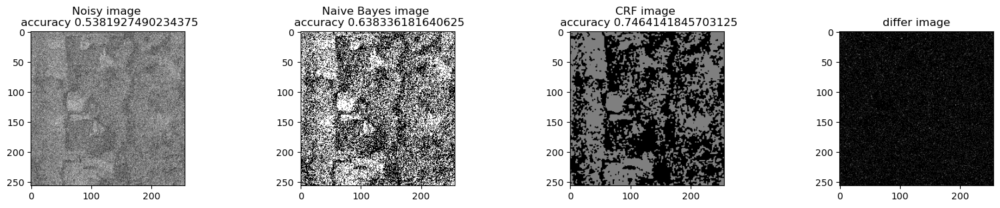

In [88]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta,
                          schedule=linear_multiplicative_cooling_schedule, temprature_function_constant=0.5)

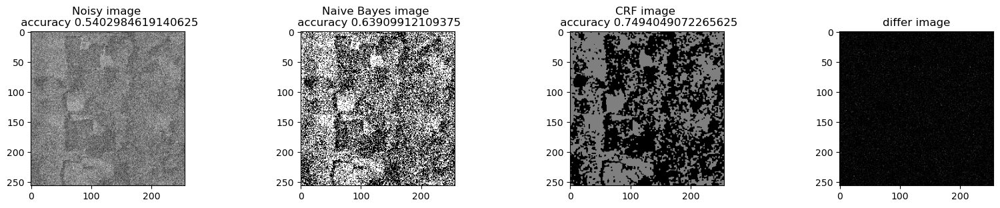

In [89]:
a_complete_set_for_part_1(arr, max_iter=1e6, var=1e4, betha=bta,
                          schedule=linear_multiplicative_cooling_schedule, temprature_function_constant=1.5)